In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
import plotly.express as px
from fbprophet import Prophet
%matplotlib inline
import warnings

warnings.filterwarnings('ignore')

mpl.rcParams['figure.figsize'] = (10,8)
mpl.rcParams['axes.grid'] = False

# Importing and Modifying Daily dataset

In [2]:
daily_df = pd.read_csv(r"daily.csv",sep=';',names=['Year', 'Month', 'Day', 'Decimal Date', 'Daily Sunspot Number', 'Standard Deviation', 'Number of Observations', 'Definitive/Provisional indicator'],parse_dates= {"Date" : ["Year","Month","Day"]})
daily_df.replace({
    "Daily Sunspot Number":-1,
    "Standard Deviation":-1
},np.NaN,inplace=True)
daily_df.dropna(how="any",inplace=True)

In [3]:
#daily data
daily_df

,Date,Decimal Date,Daily Sunspot Number,Standard Deviation,Number of Observations,Definitive/Provisional indicator
7,1818-01-08,1818.021,65.0,10.2,1,1
12,1818-01-13,1818.034,37.0,7.7,1,1
16,1818-01-17,1818.045,77.0,11.1,1,1
17,1818-01-18,1818.048,98.0,12.6,1,1
18,1818-01-19,1818.051,105.0,13.0,1,1
...,...,...,...,...,...,...
74230,2021-03-27,2021.234,19.0,6.1,19,0
74231,2021-03-28,2021.237,12.0,0.5,34,0
74232,2021-03-29,2021.240,12.0,2.9,47,0
74233,2021-03-30,2021.242,10.0,5.6,44,0


In [4]:
daily_df.head()

,Date,Decimal Date,Daily Sunspot Number,Standard Deviation,Number of Observations,Definitive/Provisional indicator
7,1818-01-08,1818.021,65.0,10.2,1,1
12,1818-01-13,1818.034,37.0,7.7,1,1
16,1818-01-17,1818.045,77.0,11.1,1,1
17,1818-01-18,1818.048,98.0,12.6,1,1
18,1818-01-19,1818.051,105.0,13.0,1,1


In [5]:
daily_df.tail()

,Date,Decimal Date,Daily Sunspot Number,Standard Deviation,Number of Observations,Definitive/Provisional indicator
74230,2021-03-27,2021.234,19.0,6.1,19,0
74231,2021-03-28,2021.237,12.0,0.5,34,0
74232,2021-03-29,2021.240,12.0,2.9,47,0
74233,2021-03-30,2021.242,10.0,5.6,44,0
74234,2021-03-31,2021.245,0.0,1.8,39,0


In [6]:
daily_df.describe()

,Decimal Date,Daily Sunspot Number,Standard Deviation,Number of Observations,Definitive/Provisional indicator
count,70988.000000,70988.000000,70988.000000,70988.000000,70988.000000
mean,1923.525801,82.403674,7.253177,4.879642,0.998732
std,56.994209,77.238675,4.579512,8.527359,0.035584
min,1818.021000,0.000000,0.000000,1.000000,0.000000
25%,1875.480250,20.000000,3.400000,1.000000,1.000000
50%,1924.071000,62.000000,6.800000,1.000000,1.000000
75%,1972.657750,127.000000,10.200000,1.000000,1.000000
max,2021.245000,528.000000,77.700000,69.000000,1.000000


In [7]:

fig= px.line(daily_df.reset_index(), x= 'Date', y='Daily Sunspot Number', title='Daily Data')
fig.update_xaxes(rangeslider_visible=True, rangeselector=dict(
    buttons=list([
        dict(count=1,label='1y', step='year', stepmode='backward'),
        dict(count=2,label='3y', step='year', stepmode='backward'),
        dict(count=3,label='5y', step='year', stepmode='backward'),
        dict(count=4,label='7y', step='year', stepmode='backward'),
        dict(step='all')
    ])
  )
)
fig.show()

In [8]:
daily_df.drop(['Decimal Date','Standard Deviation','Number of Observations','Definitive/Provisional indicator'],axis=1,inplace=True)
daily_df.columns = ['ds','y'] 

In [9]:
daily_df

,ds,y
7,1818-01-08,65.0
12,1818-01-13,37.0
16,1818-01-17,77.0
17,1818-01-18,98.0
18,1818-01-19,105.0
...,...,...
74230,2021-03-27,19.0
74231,2021-03-28,12.0
74232,2021-03-29,12.0
74233,2021-03-30,10.0


# Training model- Daily

In [21]:
d = Prophet(interval_width=0.95,changepoint_range=0.8,n_changepoints=15,seasonality_prior_scale=25,changepoint_prior_scale=25, daily_seasonality= False).add_seasonality(name='daily', period= 365,fourier_order=10)
model_d = d.fit(daily_df)

# Forecasting-Daily

In [22]:
future_daily= d.make_future_dataframe(periods=365, freq = 'D')
forecast_daily= d.predict(future_daily)
forecast_daily

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1818-01-08,7.505411,-144.123935,147.504614,7.505411,7.505411,-6.161833,-6.161833,-6.161833,6.284523,...,0.085157,0.085157,0.085157,-12.531512,-12.531512,-12.531512,0.0,0.0,0.0,1.343578
1,1818-01-13,7.580776,-141.314952,145.625162,7.580776,7.580776,-4.724036,-4.724036,-4.724036,7.790545,...,0.029050,0.029050,0.029050,-12.543630,-12.543630,-12.543630,0.0,0.0,0.0,2.856740
2,1818-01-17,7.641067,-136.049567,155.671901,7.641067,7.641067,-3.483372,-3.483372,-3.483372,8.470233,...,-0.035085,-0.035085,-0.035085,-11.918520,-11.918520,-11.918520,0.0,0.0,0.0,4.157695
3,1818-01-18,7.656140,-134.872343,152.731224,7.656140,7.656140,-3.261329,-3.261329,-3.261329,8.533697,...,-0.104752,-0.104752,-0.104752,-11.690275,-11.690275,-11.690275,0.0,0.0,0.0,4.394811
4,1818-01-19,7.671213,-142.361489,138.446845,7.671213,7.671213,-2.803453,-2.803453,-2.803453,8.551570,...,0.083528,0.083528,0.083528,-11.438551,-11.438551,-11.438551,0.0,0.0,0.0,4.867760
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71348,2022-03-27,25.007356,-123.749331,167.802482,24.114105,25.355243,-0.014598,-0.014598,-0.014598,-3.907335,...,-0.104752,-0.104752,-0.104752,3.997488,3.997488,3.997488,0.0,0.0,0.0,24.992758
71349,2022-03-28,25.000159,-122.924773,161.616295,24.101903,25.356134,0.066159,0.066159,0.066159,-4.138126,...,0.083528,0.083528,0.083528,4.120757,4.120757,4.120757,0.0,0.0,0.0,25.066317
71350,2022-03-29,24.992961,-125.339371,159.730724,24.089701,25.350970,-0.142648,-0.142648,-0.142648,-4.406633,...,0.029050,0.029050,0.029050,4.234935,4.234935,4.234935,0.0,0.0,0.0,24.850313
71351,2022-03-30,24.985763,-112.087487,162.067080,24.077499,25.345806,-0.218329,-0.218329,-0.218329,-4.707034,...,0.148932,0.148932,0.148932,4.339772,4.339772,4.339772,0.0,0.0,0.0,24.767434


# Narrative
##### yhat : the predicted forecast
##### yhat_lower : the lower border of the prediction
##### yhat_upper: the upper border of the prediction

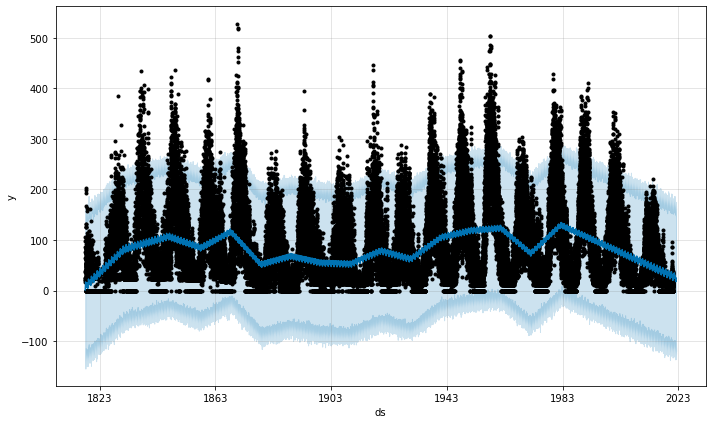

In [23]:
#plotting the forecasted data
plot1 = d.plot(forecast_daily)

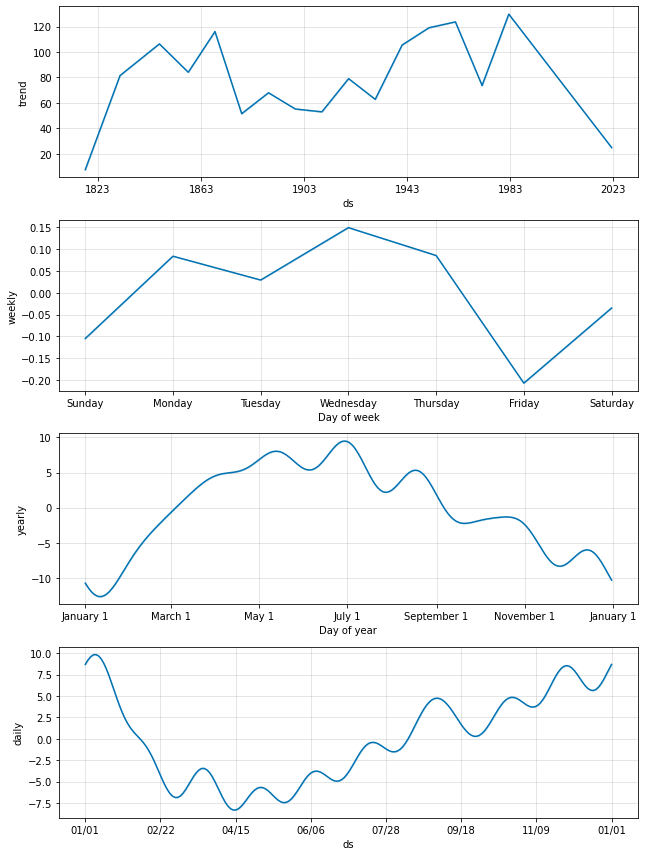

In [24]:
plot2 = d.plot_components(forecast_daily)

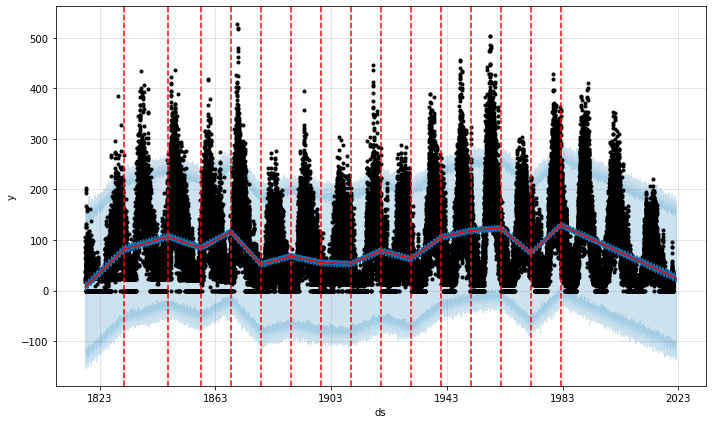

In [25]:
#Changepoints
from prophet.plot import add_changepoints_to_plot
fig_daily= d.plot(forecast_daily)
a_daily= add_changepoints_to_plot(fig_daily.gca(), d, forecast_daily)

In [26]:
#Cross Validation
from fbprophet.diagnostics import cross_validation
daily_df_cv = cross_validation(d, initial='70000 days', period='180 days', horizon = '365 days')
daily_df_cv.head()

INFO:fbprophet:Making 22 forecasts with cutoffs between 2009-11-24 00:00:00 and 2020-03-31 00:00:00


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2009-11-25,67.925088,-64.824010,218.018047,0.0,2009-11-24
1,2009-11-26,68.254049,-73.953705,221.777526,0.0,2009-11-24
2,2009-11-27,68.357311,-78.730782,219.947723,0.0,2009-11-24
3,2009-11-28,69.030577,-79.607738,221.966462,0.0,2009-11-24
4,2009-11-29,69.347564,-82.037154,218.253867,0.0,2009-11-24


# Performance Metric

In [27]:
from fbprophet.diagnostics import performance_metrics
daily_df_p = performance_metrics(daily_df_cv)
daily_df_p.head()

INFO:fbprophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,coverage
0,37 days,2072.322979,45.522774,39.131897,0.708100,0.998755
1,38 days,2076.693775,45.570756,39.054448,0.720928,0.998755
2,39 days,2071.995421,45.519176,38.949734,0.720928,0.998755
3,40 days,2061.363827,45.402245,38.829126,0.727101,0.998755
4,41 days,2055.801570,45.340948,38.725351,0.727101,0.998755


# Visualizing Performance metric

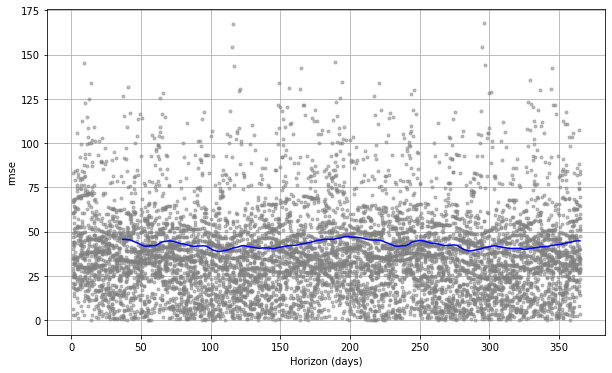

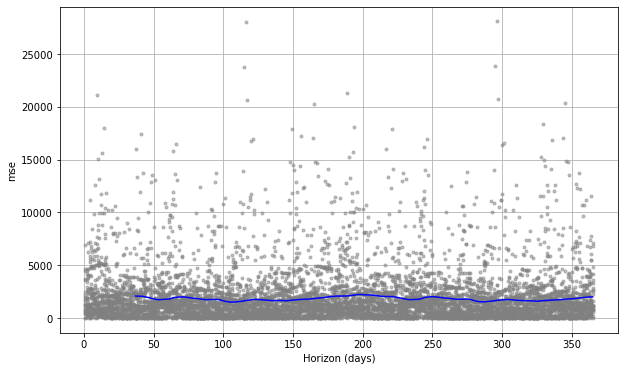

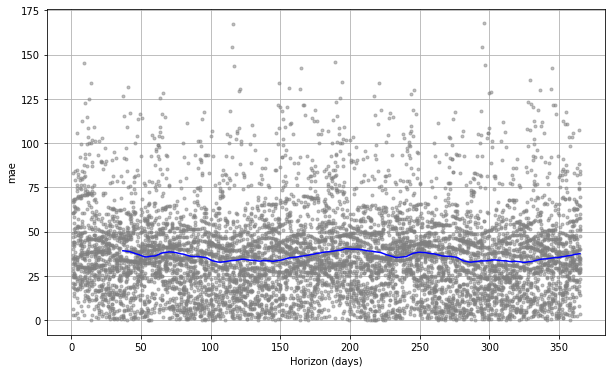

In [28]:
from fbprophet.plot import plot_cross_validation_metric
fig_cv= plot_cross_validation_metric(daily_df_cv, metric='rmse')
fig_cv1 = plot_cross_validation_metric(daily_df_cv, metric='mse')
fig_cv2 = plot_cross_validation_metric(daily_df_cv, metric='mae')

# R2 Score and MAE

In [29]:
from sklearn.metrics import r2_score
r2_score(daily_df_cv.y,daily_df_cv.yhat)

0.17075451308526235

In [30]:
from sklearn.metrics import mean_absolute_error
mean_absolute_error(daily_df_cv.y,daily_df_cv.yhat)

36.207355725864986

# Finding Outliers

In [31]:
daily_df.y.mean()

82.40367386037077

In [32]:
daily_df.y.std()

77.23867489706019

In [33]:
upper = daily_df.y.mean() + 3*daily_df.y.std()
lower = daily_df.y.mean() - 3*daily_df.y.std()
print('upper',upper)
print('lower',lower)

upper 314.1196985515513
lower -149.3123508308098


In [34]:
daily_df[(daily_df.y > upper) | (daily_df.y < lower)]

,ds,y
4197,1829-06-29,385.0
4496,1830-04-24,327.0
6681,1836-04-17,345.0
6818,1836-09-01,327.0
6862,1836-10-15,337.0
...,...,...
66925,2001-03-27,352.0
66926,2001-03-28,343.0
66927,2001-03-29,340.0
66928,2001-03-30,338.0


In [35]:
daily_df_out = daily_df[(daily_df.y < upper) & (daily_df.y > lower)]
daily_df_out.shape

(70261, 2)

In [36]:
daily_df.shape[0] - daily_df_out.shape[0]

727

# Forecasting-100 days

In [37]:
daily_100 = pd.read_csv(r"daily.csv",sep=';',names=['Year', 'Month', 'Day', 'Decimal Date', 'Daily Sunspot Number', 'Standard Deviation', 'Number of Observations', 'Definitive/Provisional indicator'],parse_dates= {"Date" : ["Year","Month","Day"]})
daily_100.replace({
    "Daily Sunspot Number":-1,
    "Standard Deviation":-1
},np.NaN,inplace=True)
daily_100.dropna(how="any",inplace=True)

In [38]:
daily_100.drop(['Decimal Date','Standard Deviation','Number of Observations','Definitive/Provisional indicator'],axis=1,inplace=True)
daily_100.columns = ['ds','y'] 

In [39]:
#floor and cap
floor = daily_100.y.quantile(0.05)
daily_100['floor'] = floor
cap = daily_100.y.quantile(0.95)
daily_100['cap'] = cap

In [40]:
d1 = Prophet(growth='logistic',interval_width=0.95,changepoint_range=0.8,n_changepoints=15,seasonality_prior_scale=25,changepoint_prior_scale=25, daily_seasonality= False, seasonality_mode='additive').add_seasonality(name='daily', period= 365,fourier_order=10)
model_d1 = d1.fit(daily_100)

In [41]:
#Predicting number of sunspots for 100 days into the future
future_daily_100 = d1.make_future_dataframe(periods=100,freq='D', include_history= True)
future_daily_100['floor'] = floor
future_daily_100['cap'] = cap
forecast_daily_100 = d1.predict(future_daily_100)
forecast_daily_100

,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1818-01-08,56.236666,234.0,0.0,-96.428314,190.961901,56.236666,56.236666,-6.314694,-6.314694,...,0.067539,0.067539,0.067539,-12.529196,-12.529196,-12.529196,0.0,0.0,0.0,49.921972
1,1818-01-13,56.236188,234.0,0.0,-83.829437,188.761693,56.236188,56.236188,-4.748068,-4.748068,...,0.009664,0.009664,0.009664,-12.504725,-12.504725,-12.504725,0.0,0.0,0.0,51.488120
2,1818-01-17,56.235806,234.0,0.0,-93.994457,192.380864,56.235806,56.235806,-3.425745,-3.425745,...,-0.013491,-0.013491,-0.013491,-11.875641,-11.875641,-11.875641,0.0,0.0,0.0,52.810061
3,1818-01-18,56.235710,234.0,0.0,-88.103375,199.950638,56.235710,56.235710,-3.231655,-3.231655,...,-0.111745,-0.111745,-0.111745,-11.650160,-11.650160,-11.650160,0.0,0.0,0.0,53.004055
4,1818-01-19,56.235615,234.0,0.0,-103.284345,199.934943,56.235615,56.235615,-2.759380,-2.759380,...,0.093817,0.093817,0.093817,-11.402546,-11.402546,-11.402546,0.0,0.0,0.0,53.476234
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71083,2021-07-05,36.645781,234.0,0.0,-111.983666,179.961938,36.645781,36.645781,5.634130,5.634130,...,0.093817,0.093817,0.093817,8.770441,8.770441,8.770441,0.0,0.0,0.0,42.279911
71084,2021-07-06,36.641684,234.0,0.0,-96.591270,177.516670,36.641684,36.641684,5.614999,5.614999,...,0.009664,0.009664,0.009664,8.555500,8.555500,8.555500,0.0,0.0,0.0,42.256683
71085,2021-07-07,36.637587,234.0,0.0,-96.340907,179.602492,36.637587,36.637587,5.777030,5.777030,...,0.141737,0.141737,0.141737,8.306174,8.306174,8.306174,0.0,0.0,0.0,42.414617
71086,2021-07-08,36.633490,234.0,0.0,-103.849811,187.302441,36.633490,36.633490,5.695443,5.695443,...,0.067539,0.067539,0.067539,8.025422,8.025422,8.025422,0.0,0.0,0.0,42.328934


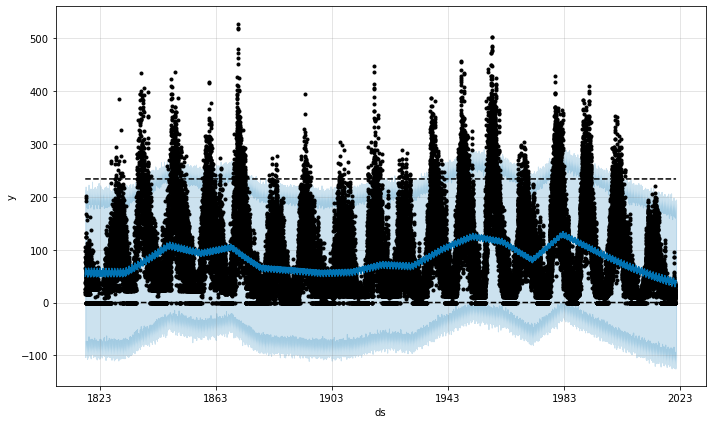

In [42]:
#Plotting 100 days forecasted data
plot3 = d1.plot(forecast_daily_100)

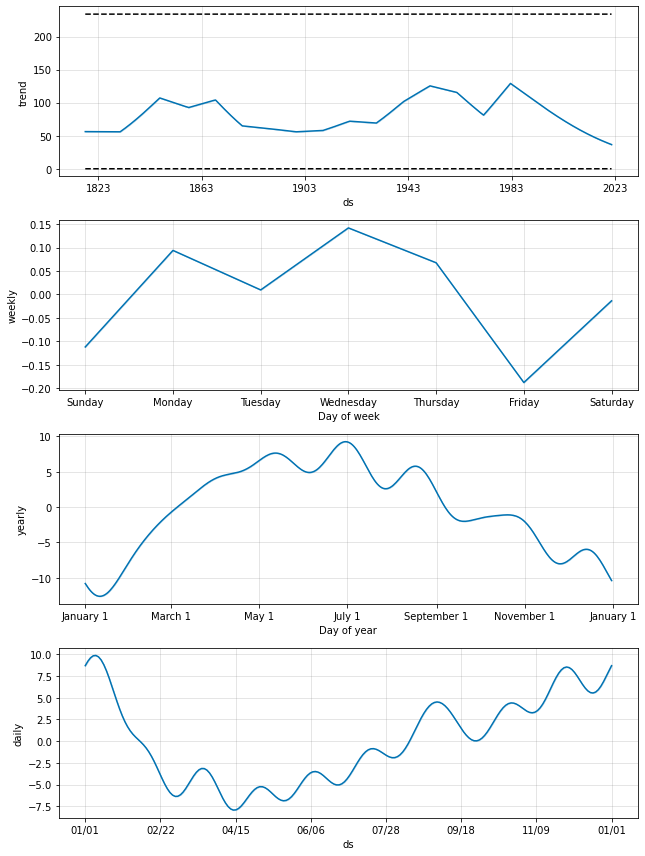

In [43]:
plot2 = d1.plot_components(forecast_daily_100)

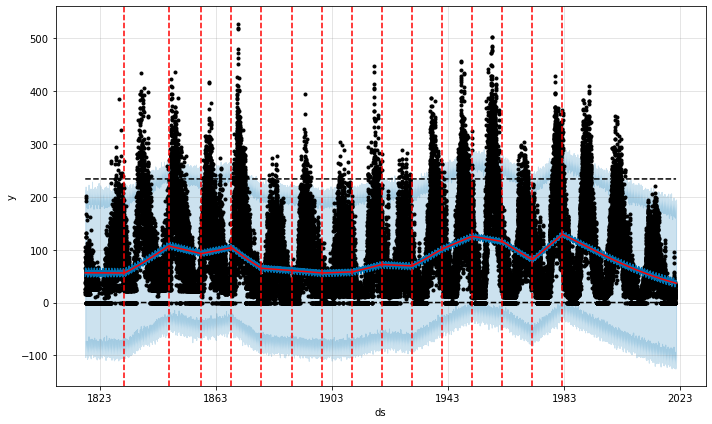

In [44]:
#Changepoints
from prophet.plot import add_changepoints_to_plot
fig_daily_100= d1.plot(forecast_daily_100)
a_daily_100= add_changepoints_to_plot(fig_daily_100.gca(), d1, forecast_daily_100)

In [45]:
#Cross Validation
from fbprophet.diagnostics import cross_validation
daily_100_cv = cross_validation(d1, initial='70000 days', period='180 days', horizon = '365 days')
daily_100_cv.head()

INFO:fbprophet:Making 22 forecasts with cutoffs between 2009-11-24 00:00:00 and 2020-03-31 00:00:00


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2009-11-25,71.535001,-83.882495,219.014728,0.0,2009-11-24
1,2009-11-26,71.853462,-68.716873,223.648697,0.0,2009-11-24
2,2009-11-27,72.015287,-72.036467,214.570991,0.0,2009-11-24
3,2009-11-28,72.698647,-79.113660,218.345375,0.0,2009-11-24
4,2009-11-29,72.985784,-81.364726,229.750122,0.0,2009-11-24


In [46]:
#Performance metrics
from fbprophet.diagnostics import performance_metrics
daily_100_p = performance_metrics(daily_100_cv)
daily_100_p.head()

INFO:fbprophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,coverage
0,37 days,2168.218438,46.564133,40.852299,0.822548,1.0
1,38 days,2174.115344,46.627410,40.802429,0.853003,1.0
2,39 days,2170.915084,46.593080,40.715706,0.853003,1.0
3,40 days,2163.226456,46.510498,40.616652,0.867951,1.0
4,41 days,2160.385188,46.479944,40.536703,0.854676,1.0


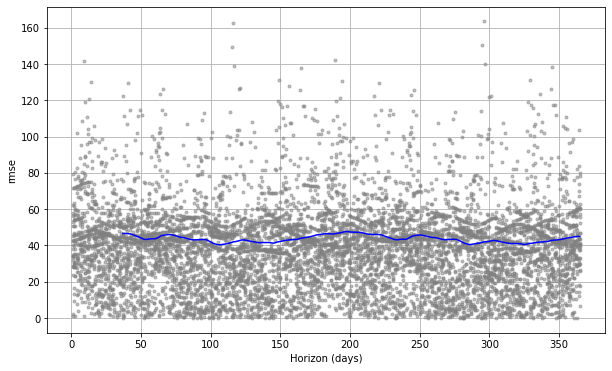

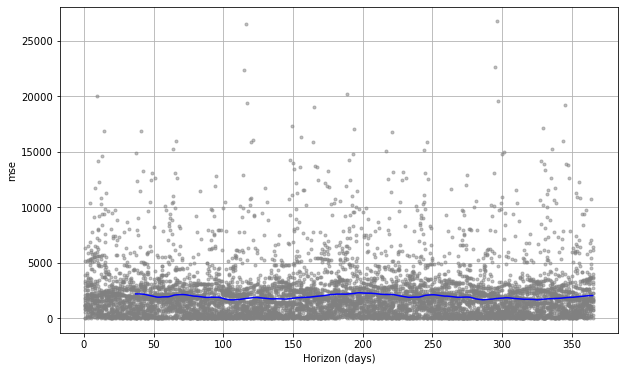

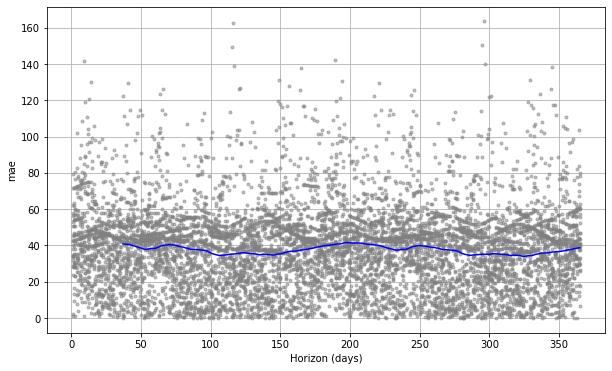

In [47]:
#Visualizing Performance metrics
from fbprophet.plot import plot_cross_validation_metric
fig_cv= plot_cross_validation_metric(daily_100_cv, metric='rmse')
fig_cv1 = plot_cross_validation_metric(daily_100_cv, metric='mse')
fig_cv2 = plot_cross_validation_metric(daily_100_cv, metric='mae')

In [48]:
#R2 score
from sklearn.metrics import r2_score
r2_score(daily_100_cv.y,daily_100_cv.yhat)

0.13329552739417982

In [49]:
#MAE
from sklearn.metrics import mean_absolute_error
mean_absolute_error(daily_100_cv.y,daily_100_cv.yhat)

37.82771939035977

# Forecasting - 200 days

In [50]:
daily_200 = pd.read_csv(r"daily.csv",sep=';',names=['Year', 'Month', 'Day', 'Decimal Date', 'Daily Sunspot Number', 'Standard Deviation', 'Number of Observations', 'Definitive/Provisional indicator'],parse_dates= {"Date" : ["Year","Month","Day"]})
daily_200.replace({
    "Daily Sunspot Number":-1,
    "Standard Deviation":-1
},np.NaN,inplace=True)
daily_200.dropna(how="any",inplace=True)

In [51]:
daily_200.drop(['Decimal Date','Standard Deviation','Number of Observations','Definitive/Provisional indicator'],axis=1,inplace=True)
daily_200.columns = ['ds','y'] 

In [52]:
#floor and cap
floor = daily_200.y.quantile(0.05)
daily_200['floor'] = floor
cap = daily_200.y.quantile(0.95)
daily_200['cap'] = cap

In [53]:
d2 = Prophet(growth='logistic',interval_width=0.95,changepoint_range=0.8,n_changepoints=15,seasonality_prior_scale=25,changepoint_prior_scale=25, daily_seasonality= False, seasonality_mode='additive').add_seasonality(name='daily', period= 365,fourier_order=10)
model_d2 = d2.fit(daily_200)

In [54]:
#Predicting number of sunspots for 200 days into the future
future_daily_200 = d2.make_future_dataframe(periods=200,freq='D', include_history= True)
future_daily_200['floor'] = floor
future_daily_200['cap'] = cap
forecast_daily_200 = d2.predict(future_daily_100)
forecast_daily_200

,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1818-01-08,56.236666,234.0,0.0,-97.199270,207.560287,56.236666,56.236666,-6.314694,-6.314694,...,0.067539,0.067539,0.067539,-12.529196,-12.529196,-12.529196,0.0,0.0,0.0,49.921972
1,1818-01-13,56.236188,234.0,0.0,-92.236305,200.284751,56.236188,56.236188,-4.748068,-4.748068,...,0.009664,0.009664,0.009664,-12.504725,-12.504725,-12.504725,0.0,0.0,0.0,51.488120
2,1818-01-17,56.235806,234.0,0.0,-92.334746,196.767863,56.235806,56.235806,-3.425745,-3.425745,...,-0.013491,-0.013491,-0.013491,-11.875641,-11.875641,-11.875641,0.0,0.0,0.0,52.810061
3,1818-01-18,56.235710,234.0,0.0,-78.202438,197.631611,56.235710,56.235710,-3.231655,-3.231655,...,-0.111745,-0.111745,-0.111745,-11.650160,-11.650160,-11.650160,0.0,0.0,0.0,53.004055
4,1818-01-19,56.235615,234.0,0.0,-88.387373,190.710392,56.235615,56.235615,-2.759380,-2.759380,...,0.093817,0.093817,0.093817,-11.402546,-11.402546,-11.402546,0.0,0.0,0.0,53.476234
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71083,2021-07-05,36.645781,234.0,0.0,-95.895200,180.622130,36.645781,36.645781,5.634130,5.634130,...,0.093817,0.093817,0.093817,8.770441,8.770441,8.770441,0.0,0.0,0.0,42.279911
71084,2021-07-06,36.641684,234.0,0.0,-99.381697,187.751707,36.641684,36.641684,5.614999,5.614999,...,0.009664,0.009664,0.009664,8.555500,8.555500,8.555500,0.0,0.0,0.0,42.256683
71085,2021-07-07,36.637587,234.0,0.0,-99.171673,190.151374,36.637587,36.637587,5.777030,5.777030,...,0.141737,0.141737,0.141737,8.306174,8.306174,8.306174,0.0,0.0,0.0,42.414617
71086,2021-07-08,36.633490,234.0,0.0,-98.121045,191.249180,36.633490,36.633490,5.695443,5.695443,...,0.067539,0.067539,0.067539,8.025422,8.025422,8.025422,0.0,0.0,0.0,42.328934


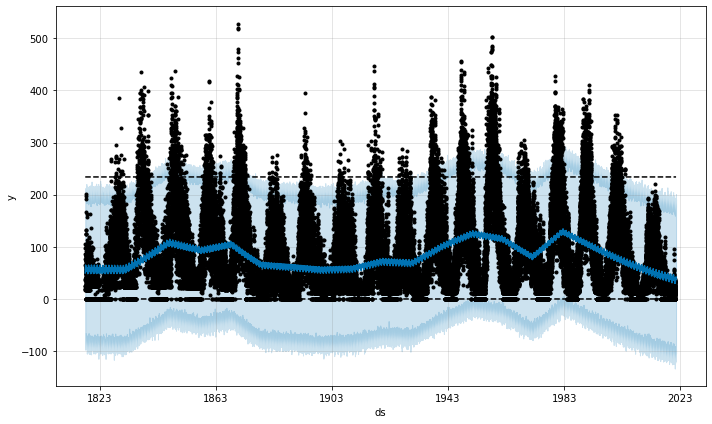

In [55]:
#Plotting 200 days forecasted data
plot3 = d2.plot(forecast_daily_200)

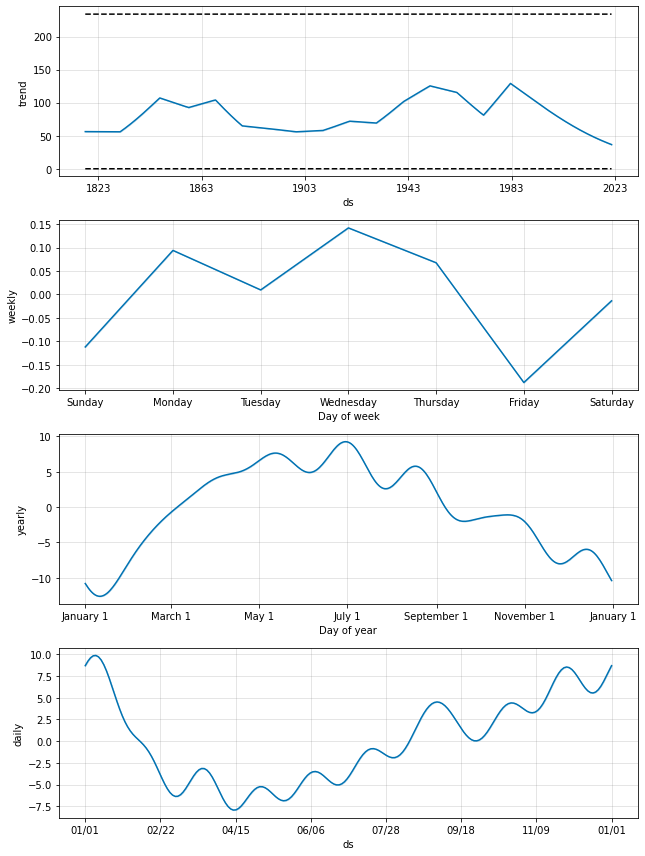

In [56]:
plot2 = d2.plot_components(forecast_daily_200)

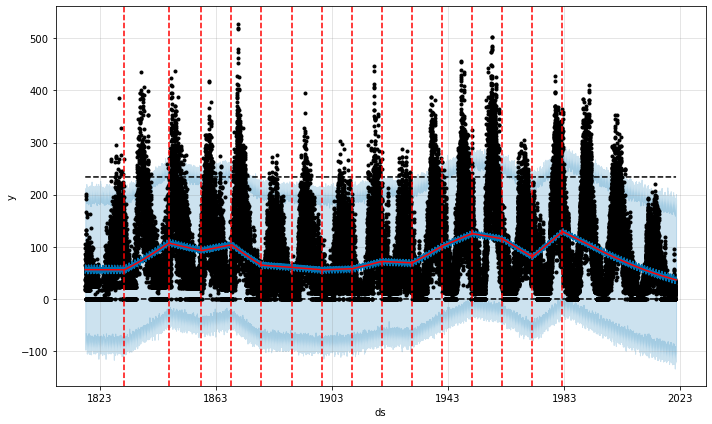

In [57]:
#Changepoints
from prophet.plot import add_changepoints_to_plot
fig_daily_200= d2.plot(forecast_daily_200)
a_daily_200= add_changepoints_to_plot(fig_daily_200.gca(), d2, forecast_daily_200)

In [58]:
#Cross Validation
from fbprophet.diagnostics import cross_validation
daily_200_cv = cross_validation(d2, initial='70500 days', period='180 days', horizon = '365 days')
daily_200_cv.head()

INFO:fbprophet:Making 19 forecasts with cutoffs between 2011-05-18 00:00:00 and 2020-03-31 00:00:00


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2011-05-19,64.123546,-77.777806,221.046183,36.0,2011-05-18
1,2011-05-20,63.789178,-79.683061,206.092682,35.0,2011-05-18
2,2011-05-21,64.000618,-80.851474,216.126339,36.0,2011-05-18
3,2011-05-22,63.841511,-76.736703,203.531606,56.0,2011-05-18
4,2011-05-23,64.059590,-74.511692,201.641598,31.0,2011-05-18


In [59]:
#Performance metrics
from fbprophet.diagnostics import performance_metrics
daily_200_p = performance_metrics(daily_200_cv)
daily_200_p.head()

INFO:fbprophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,coverage
0,37 days,2037.867545,45.142746,38.937910,0.595415,1.0
1,38 days,2043.647814,45.206723,38.863114,0.594876,1.0
2,39 days,2040.841074,45.175669,38.766835,0.594876,1.0
3,40 days,2032.713225,45.085621,38.656001,0.597856,1.0
4,41 days,2031.060712,45.067291,38.572783,0.597856,1.0


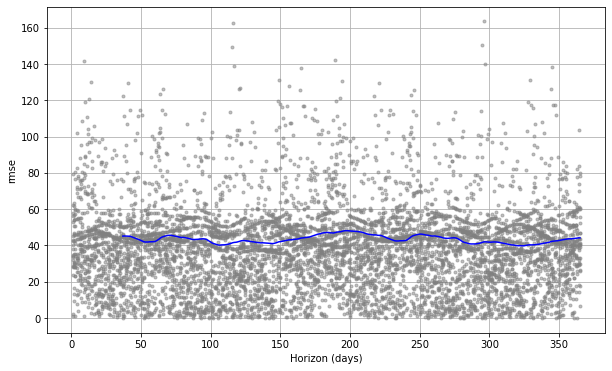

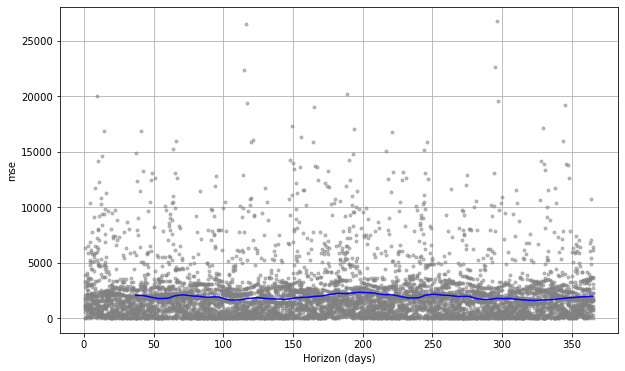

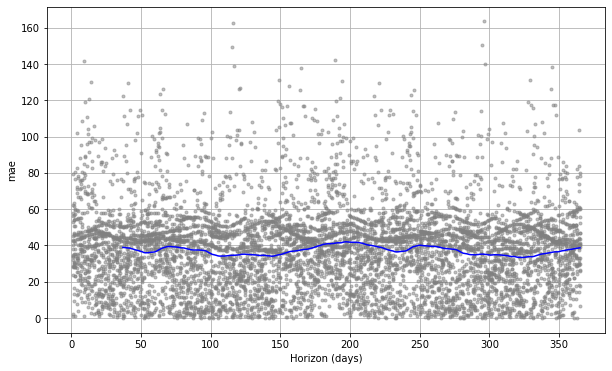

In [60]:
#Visualizing Performance metrics
from fbprophet.plot import plot_cross_validation_metric
fig_cv= plot_cross_validation_metric(daily_200_cv, metric='rmse')
fig_cv1 = plot_cross_validation_metric(daily_200_cv, metric='mse')
fig_cv2 = plot_cross_validation_metric(daily_200_cv, metric='mae')

In [61]:
#R2 score
from sklearn.metrics import r2_score
r2_score(daily_200_cv.y,daily_200_cv.yhat)

0.19470698691627142

In [62]:
#MAE
from sklearn.metrics import mean_absolute_error
mean_absolute_error(daily_200_cv.y,daily_200_cv.yhat)

37.42317640499025

# Forecasting - 365 days

In [63]:
daily_3 = pd.read_csv(r"daily.csv",sep=';',names=['Year', 'Month', 'Day', 'Decimal Date', 'Daily Sunspot Number', 'Standard Deviation', 'Number of Observations', 'Definitive/Provisional indicator'],parse_dates= {"Date" : ["Year","Month","Day"]})
daily_3.replace({
    "Daily Sunspot Number":-1,
    "Standard Deviation":-1
},np.NaN,inplace=True)
daily_3.dropna(how="any",inplace=True)

In [64]:
daily_3.drop(['Decimal Date','Standard Deviation','Number of Observations','Definitive/Provisional indicator'],axis=1,inplace=True)
daily_3.columns = ['ds','y'] 

In [65]:
#floor and cap
floor = daily_3.y.quantile(0.05)
daily_3['floor'] = floor
cap = daily_3.y.quantile(0.95)
daily_3['cap'] = cap

In [66]:
#Training the model
d3 = Prophet(growth='logistic',interval_width=0.95,changepoint_range=0.8,n_changepoints=15,seasonality_prior_scale=25,changepoint_prior_scale=25, daily_seasonality= False, seasonality_mode='additive').add_seasonality(name='daily', period= 365,fourier_order=10)
model_d3 = d3.fit(daily_3)

In [67]:
#Predicting number of sunspots for 365 days into the future
future_daily_3 = d1.make_future_dataframe(periods=365,freq='D', include_history= True)
future_daily_3['floor'] = floor
future_daily_3['cap'] = cap
forecast_daily_3 = d3.predict(future_daily_3)
forecast_daily_3

,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1818-01-08,56.236666,234.0,0.0,-95.462679,199.077372,56.236666,56.236666,-6.314694,-6.314694,...,0.067539,0.067539,0.067539,-12.529196,-12.529196,-12.529196,0.0,0.0,0.0,49.921972
1,1818-01-13,56.236188,234.0,0.0,-90.137668,200.952043,56.236188,56.236188,-4.748068,-4.748068,...,0.009664,0.009664,0.009664,-12.504725,-12.504725,-12.504725,0.0,0.0,0.0,51.488120
2,1818-01-17,56.235806,234.0,0.0,-87.148262,195.821667,56.235806,56.235806,-3.425745,-3.425745,...,-0.013491,-0.013491,-0.013491,-11.875641,-11.875641,-11.875641,0.0,0.0,0.0,52.810061
3,1818-01-18,56.235710,234.0,0.0,-102.229192,201.181878,56.235710,56.235710,-3.231655,-3.231655,...,-0.111745,-0.111745,-0.111745,-11.650160,-11.650160,-11.650160,0.0,0.0,0.0,53.004055
4,1818-01-19,56.235615,234.0,0.0,-83.426441,199.535271,56.235615,56.235615,-2.759380,-2.759380,...,0.093817,0.093817,0.093817,-11.402546,-11.402546,-11.402546,0.0,0.0,0.0,53.476234
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71348,2022-03-27,35.572960,234.0,0.0,-100.222838,180.802232,35.425272,35.776314,-0.295453,-0.295453,...,-0.111745,-0.111745,-0.111745,3.435785,3.435785,3.435785,0.0,0.0,0.0,35.277508
71349,2022-03-28,35.568961,234.0,0.0,-105.252142,171.097180,35.420810,35.774214,-0.187878,-0.187878,...,0.093817,0.093817,0.093817,3.570203,3.570203,3.570203,0.0,0.0,0.0,35.381083
71350,2022-03-29,35.564962,234.0,0.0,-108.307950,172.292667,35.416348,35.772114,-0.413292,-0.413292,...,0.009664,0.009664,0.009664,3.697558,3.697558,3.697558,0.0,0.0,0.0,35.151670
71351,2022-03-30,35.560964,234.0,0.0,-117.596387,177.321981,35.411887,35.770014,-0.460483,-0.460483,...,0.141737,0.141737,0.141737,3.817347,3.817347,3.817347,0.0,0.0,0.0,35.100481


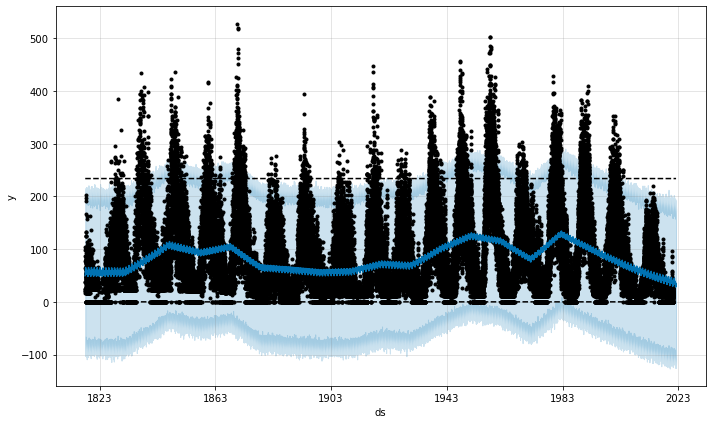

In [68]:
#Plotting 365 days forecasted data
plot3 = d3.plot(forecast_daily_3)

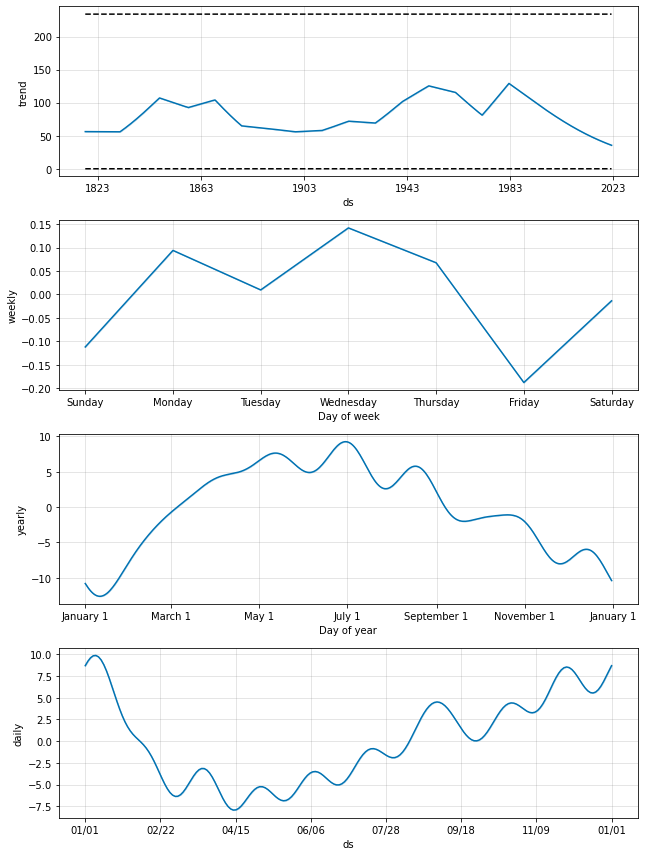

In [69]:
plot2 = d3.plot_components(forecast_daily_3)

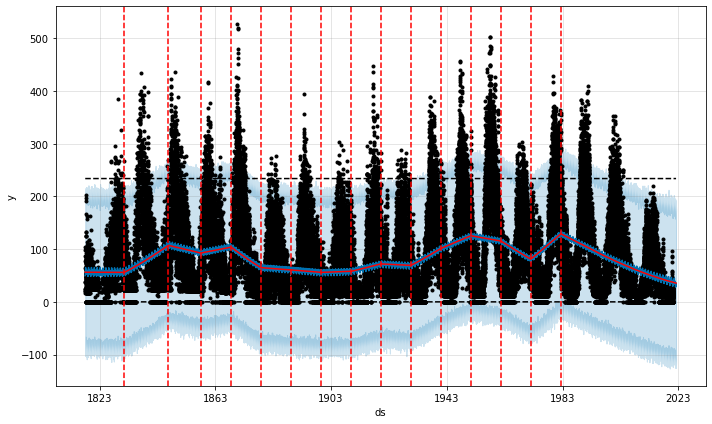

In [70]:
#Changepoints
from prophet.plot import add_changepoints_to_plot
fig_daily_3= d3.plot(forecast_daily_3)
a_daily_3= add_changepoints_to_plot(fig_daily_3.gca(), d3, forecast_daily_3)

In [71]:
#Cross Validation
from fbprophet.diagnostics import cross_validation
daily_3_cv = cross_validation(d3, initial='71000 days', period='180 days', horizon = '365 days')
daily_3_cv.head()

INFO:fbprophet:Making 16 forecasts with cutoffs between 2012-11-08 00:00:00 and 2020-03-31 00:00:00


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2012-11-09,62.702378,-81.662501,204.907815,65.0,2012-11-08
1,2012-11-10,62.648430,-93.003735,221.430131,79.0,2012-11-08
2,2012-11-11,62.267880,-81.758359,202.132294,108.0,2012-11-08
3,2012-11-12,62.287008,-82.107761,209.428221,122.0,2012-11-08
4,2012-11-13,62.036038,-91.373875,210.251051,121.0,2012-11-08


In [72]:
#Performance metrics
from fbprophet.diagnostics import performance_metrics
daily_3_p = performance_metrics(daily_3_cv)
daily_3_p.head()

INFO:fbprophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,coverage
0,37 days,1943.361157,44.083570,38.072936,0.852056,1.0
1,38 days,1960.173902,44.273851,38.100372,0.852056,1.0
2,39 days,1961.563765,44.289545,38.025996,0.837113,1.0
3,40 days,1956.596349,44.233430,37.924960,0.828682,1.0
4,41 days,1960.727078,44.280098,37.869896,0.819545,1.0


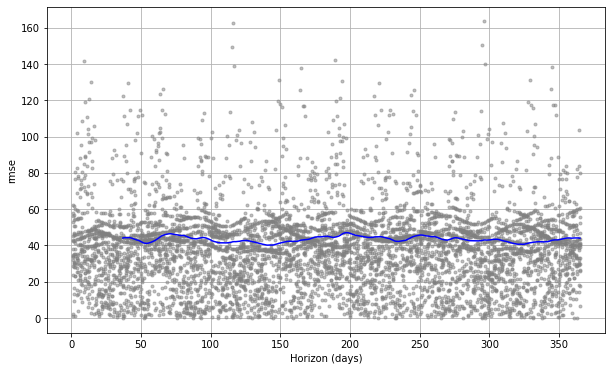

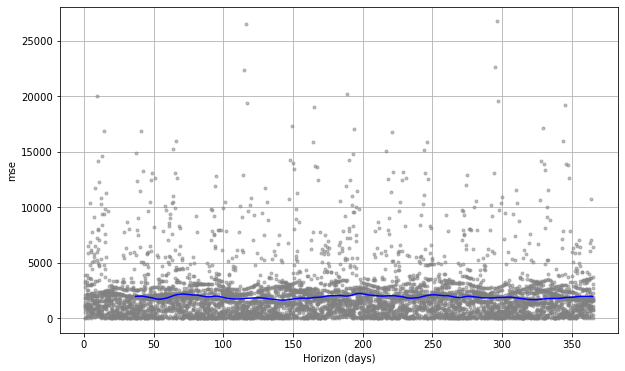

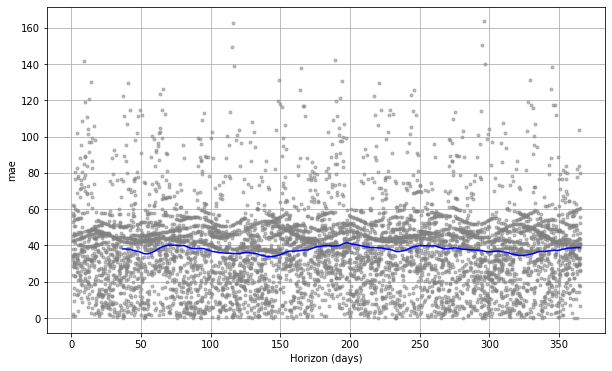

In [73]:
#Visualizing Performance metrics
from fbprophet.plot import plot_cross_validation_metric
fig_cv= plot_cross_validation_metric(daily_3_cv, metric='rmse')
fig_cv1 = plot_cross_validation_metric(daily_3_cv, metric='mse')
fig_cv2 = plot_cross_validation_metric(daily_3_cv, metric='mae')

In [74]:
#R2 score
from sklearn.metrics import r2_score
r2_score(daily_3_cv.y,daily_3_cv.yhat)

0.15279067422036285

In [75]:
#MAE
from sklearn.metrics import mean_absolute_error
mean_absolute_error(daily_3_cv.y,daily_3_cv.yhat)

37.778212674784605